<div class="text-warning">
    <div class="text-center">
        <div class="h1">practise 6 - fraud etherium detection</div>
        <div class="h5">maktabkhooneh</div>
    </div>
    <div class="h4">Name: Amir Mohammad Arghavany</div>
    <div class="h4">Email: amir.arghavoon@gmail.com</div>
</div>

# import packages

In [1]:
# base packages & EDA
import numpy as np
import pandas as pd
# progress
from tqdm.auto import tqdm
# check model
from pycaret.classification import *
# feature importance
import shap
# check dataset
from pandas_profiling import ProfileReport
# visualization
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
%matplotlib inline
# preprocessing
from sklearn.preprocessing import StandardScaler # check others
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
# train & test
from sklearn.model_selection import train_test_split
# transformer & pipeline
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
# hyper parameters
from sklearn.model_selection import GridSearchCV, KFold
# learning
from xgboost import XGBClassifier
# metrics
from sklearn.metrics import recall_score, classification_report, RocCurveDisplay, confusion_matrix
# save model
import joblib
# ignore warning
import warnings
warnings.filterwarnings('ignore')

# import dataset

In [2]:
df = pd.read_csv(r'D:\DRIVER\LEARNING\OUT OF UNIVERSITY\ML\Quize\ML PRACTICAL\Q6 - fraud detection on etherium\transaction_dataset.csv')
df.sample(3)

,Unnamed: 0,Index,Address,FLAG,Avg min between sent tnx,Avg min between received tnx,Time Diff between first and last (Mins),Sent tnx,Received Tnx,Number of Created Contracts,...,ERC20 min val sent,ERC20 max val sent,ERC20 avg val sent,ERC20 min val sent contract,ERC20 max val sent contract,ERC20 avg val sent contract,ERC20 uniq sent token name,ERC20 uniq rec token name,ERC20 most sent token type,ERC20_most_rec_token_type
9725,9725,2064,0xf2601c5a063c6a6ca86d8b6bd0543158f83a10ce,1,0.00,28660.14,200620.95,0,7,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1391,1391,1392,0x233b13a1cf092b8052666ab36343cdba1062aae1,0,0.00,2752.64,319306.25,0,116,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,None,DATAcoin
1855,1855,1856,0x30c0fb012bc5b4441d3f2328f1b085987f632677,0,23.98,3156.43,728291.43,228,229,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,None,Bulleon Promo Token


# X & Y

In [3]:
X = df.drop('FLAG', axis=1)
Y = df['FLAG']

# EDA & clean dataset

In [4]:
# check values
print('='*55, '[check] data & type')
print(X.info())

print('='*55, ['check null data'])
print(X.isna().sum())

print('='*55, 'number of unique values in each column')
print(X.nunique())

print('='*55, '[check] imbalenced data')
for i in X.columns:
    print('-'*45, i)
    print(X[i].value_counts())

print('='*55, '[check] scaling')
print(X.describe())

======================================================= [check] data & type
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9841 entries, 0 to 9840
Data columns (total 50 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Unnamed: 0                                            9841 non-null   int64  
 1   Index                                                 9841 non-null   int64  
 2   Address                                               9841 non-null   object 
 3   Avg min between sent tnx                              9841 non-null   float64
 4   Avg min between received tnx                          9841 non-null   float64
 5   Time Diff between first and last (Mins)               9841 non-null   float64
 6   Sent tnx                                              9841 non-null   int64  
 7   Received Tnx                                          9841 non-nu

        Unnamed: 0        Index  Avg min between sent tnx  \
count  9841.000000  9841.000000               9841.000000   
mean   4920.000000  1815.049893               5086.878721   
std    2840.996333  1222.621830              21486.549974   
min       0.000000     1.000000                  0.000000   
25%    2460.000000   821.000000                  0.000000   
50%    4920.000000  1641.000000                 17.340000   
75%    7380.000000  2601.000000                565.470000   
max    9840.000000  4729.000000             430287.670000   

       Avg min between received tnx  Time Diff between first and last (Mins)  \
count                   9841.000000                             9.841000e+03   
mean                    8004.851184                             2.183333e+05   
std                    23081.714801                             3.229379e+05   
min                        0.000000                             0.000000e+00   
25%                        0.000000               

In [5]:
# drop features that one of the values repeated over 85%
imbalence_limit = 0.85
print('befor:', len(X.columns))
for c in X.columns:
    vc = pd.DataFrame(X[c].value_counts())
    if (vc.iloc[0]>len(X)*imbalence_limit)[0]:
        X.drop(c, axis=1, inplace=True)
print('after:', len(X.columns))

befor: 50
after: 36


In [6]:
# drop features with unique values
X.drop(['Unnamed: 0', 'Index', 'Address'], axis=1, inplace=True)
print('after:', len(X.columns))

after: 33


In [7]:
# recreate dataframe for correlation
df = pd.concat([X, Y], axis=1)

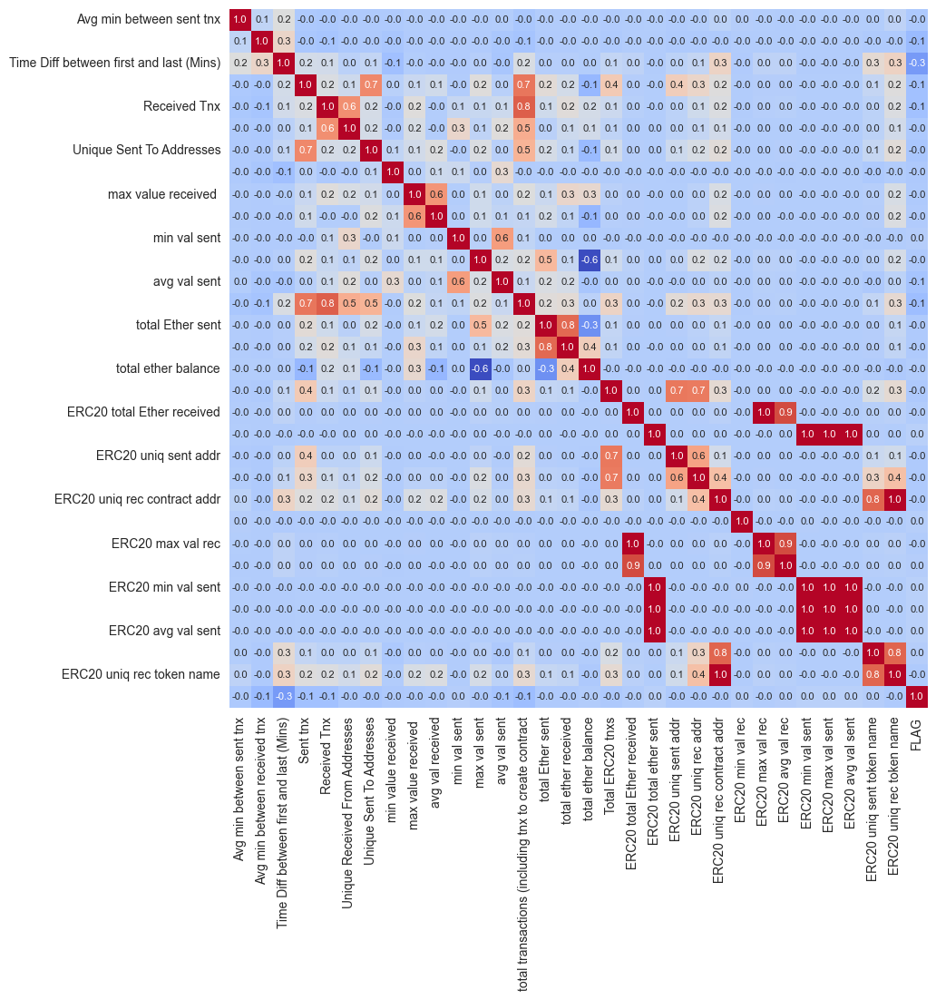

In [8]:
# correlation
corr = df.corr()
sns.heatmap(corr, square=True, fmt='.1f', annot=True, annot_kws={'size': 8}, cmap='coolwarm', cbar=False).figure.set_size_inches(10, 10)
plt.show()

In [9]:
# remove features with low corelation
corr_flag = corr['FLAG'].sort_values(ascending=False)
corr_flag_df = corr_flag[(corr_flag > 0.02) | (corr_flag < -0.02)]
df = df[corr_flag_df.keys()]
print(df.shape)

(9841, 18)


In [10]:
# remove features that have same responce -> high correlation with each other (not target)
df.drop([' ERC20 min val sent', ' ERC20 max val sent', ' ERC20 avg val sent'], axis=1, inplace=True)
print(df.shape)

(9841, 15)


# recheck database

In [11]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# check models

In [12]:
setup(df, target='FLAG', session_id=42, use_gpu=True)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

,Description,Value
0,Session id,42
1,Target,FLAG
2,Target type,Binary
3,Original data shape,"(9841, 15)"
4,Transformed data shape,"(9841, 15)"
5,Transformed train set shape,"(6888, 15)"
6,Transformed test set shape,"(2953, 15)"
7,Numeric features,14
8,Rows with missing values,8.4%
9,Preprocess,True


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: Intel(R) UHD Graphics, Vendor: Intel(R) Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that mee

In [13]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9797,0.9970,0.9436,0.9638,0.9535,0.9405,0.9407,2.9400
xgboost,Extreme Gradient Boosting,0.9782,0.9961,0.9403,0.9609,0.9503,0.9364,0.9366,0.4250
rf,Random Forest Classifier,0.9768,0.9961,0.9193,0.9745,0.9460,0.9312,0.9319,1.4140
et,Extra Trees Classifier,0.9736,0.9930,0.9056,0.9734,0.9380,0.9213,0.9224,0.9190
gbc,Gradient Boosting Classifier,0.9733,0.9957,0.9292,0.9495,0.9390,0.9219,0.9222,4.5750
ada,Ada Boost Classifier,0.9704,0.9938,0.9305,0.9360,0.9329,0.9139,0.9142,1.1810
dt,Decision Tree Classifier,0.9666,0.9529,0.9266,0.9236,0.9248,0.9034,0.9036,0.1240
knn,K Neighbors Classifier,0.9072,0.9231,0.7423,0.8226,0.7797,0.7212,0.7232,0.5870
lr,Logistic Regression,0.8465,0.8083,0.3101,0.9902,0.4691,0.4080,0.5031,0.2860
svm,SVM - Linear Kernel,0.7998,0.0000,0.3934,0.5770,0.4581,0.3433,0.3561,0.0500


LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               device='gpu', importance_type='split', learning_rate=0.1,
               max_depth=-1, min_child_samples=20, min_child_weight=0.001,
               min_split_gain=0.0, n_estimators=100, n_jobs=-1, num_leaves=31,
               objective=None, random_state=42, reg_alpha=0.0, reg_lambda=0.0,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

# fill NaN

In [14]:
si = SimpleImputer(missing_values=np.NaN, strategy='median') # check later
df = pd.DataFrame(si.fit_transform(df), columns=df.columns)
df.isna().sum()

FLAG                                                    0
 ERC20 total ether sent                                 0
 ERC20 uniq sent addr                                   0
min value received                                      0
max val sent                                            0
 Total ERC20 tnxs                                       0
Avg min between sent tnx                                0
Unique Received From Addresses                          0
Unique Sent To Addresses                                0
avg val sent                                            0
Sent tnx                                                0
Received Tnx                                            0
total transactions (including tnx to create contract    0
Avg min between received tnx                            0
Time Diff between first and last (Mins)                 0
dtype: int64

# train & test

In [15]:
X = df.drop('FLAG', axis=1)
Y = df['FLAG']
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=42, test_size=0.3, stratify=Y)

# handeling imbalenced target

In [16]:
# over sampling (SMOTE)
smote = SMOTE(random_state=42)
X_train, Y_train = smote.fit_resample(X_train, Y_train)

# scaling

In [17]:
sc = StandardScaler()
X_train1 = sc.fit_transform(X_train)
X_test1 = sc.transform(X_test)

# hyper parameters & best model

In [18]:
# search function for best parameters + report
def parameter_finder (model, parameters={}):
    X_train, X_test = X_train1, X_test1
    grid = GridSearchCV(model, 
                        param_grid = parameters, 
                        refit = True, 
                        cv = KFold(shuffle = True, random_state = 1), 
                        n_jobs = -1)
    grid_fit = grid.fit(X_train, Y_train)
    Y_train_pred = grid_fit.predict(X_train)
    Y_pred = grid_fit.predict(X_test)
    print('='*55, str(model).split('(')[0])
    print(f'best param: {grid_fit.best_params_}')
    print('-'*55, 'train report')
    print(classification_report(Y_train, Y_train_pred))
    print('-'*55, 'test report')
    print(classification_report(Y_test, Y_pred))
    print('*'*55, 'recall score')
    print('train:', np.round(recall_score(Y_train, Y_train_pred)*100, 2), '%')
    print('test:', np.round(recall_score(Y_test, Y_pred)*100, 2), '%')

In [19]:
xgbc = XGBClassifier()
params = {
      'learning_rate':[0.5],
      'n_estimators':[100],
      'subsample':[0.004],
       'max_depth':[3],
       'colsample_bytree':[0.7]
}

parameter_finder(xgbc, params)

======================================================= XGBClassifier
best param: {'colsample_bytree': 0.7, 'learning_rate': 0.5, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.004}
------------------------------------------------------- train report
              precision    recall  f1-score   support

         0.0       0.93      0.94      0.93      5363
         1.0       0.94      0.92      0.93      5363

    accuracy                           0.93     10726
   macro avg       0.93      0.93      0.93     10726
weighted avg       0.93      0.93      0.93     10726

------------------------------------------------------- test report
              precision    recall  f1-score   support

         0.0       0.98      0.93      0.96      2299
         1.0       0.80      0.93      0.86       654

    accuracy                           0.93      2953
   macro avg       0.89      0.93      0.91      2953
weighted avg       0.94      0.93      0.93      2953

**********************

# finall model

In [20]:
xgbc = XGBClassifier(colsample_bytree= 0.7, learning_rate= 0.5, max_depth= 3, n_estimators= 100,
                     subsample= 0.004)

In [21]:
xgbc.fit(X_train, Y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, objective='binary:logistic', ...)

# metrics

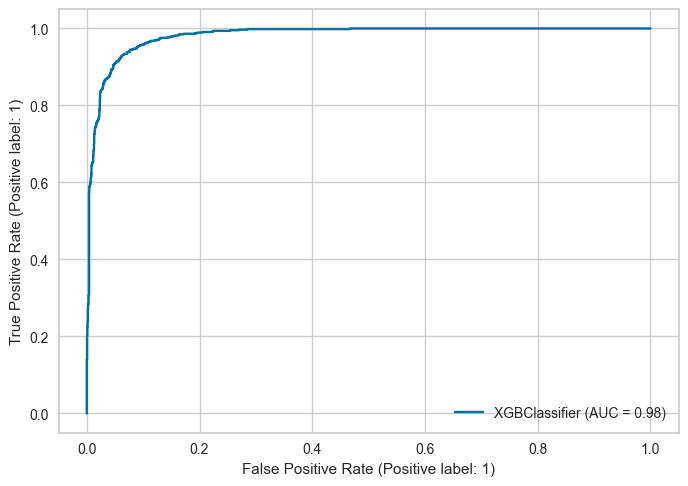

In [22]:
fig, ax = plt.subplots()
RocCurveDisplay.from_estimator(xgbc, X_test, Y_test, ax=ax)
plt.show()

In [23]:
# predict
Y_pred = xgbc.predict(X_test)
Y_train_pred = xgbc.predict(X_train)

In [24]:
# recall
print('train:', np.round(recall_score(Y_train, Y_train_pred)*100, 2), '%')
print('test:', np.round(recall_score(Y_test, Y_pred)*100, 2), '%')

train: 93.27 %
test: 93.43 %


In [25]:
# classification report
print('-'*55, 'train report')
print(classification_report(Y_train, Y_train_pred))
print('-'*55, 'test report')
print(classification_report(Y_test, Y_pred))

------------------------------------------------------- train report
              precision    recall  f1-score   support

         0.0       0.93      0.93      0.93      5363
         1.0       0.93      0.93      0.93      5363

    accuracy                           0.93     10726
   macro avg       0.93      0.93      0.93     10726
weighted avg       0.93      0.93      0.93     10726

------------------------------------------------------- test report
              precision    recall  f1-score   support

         0.0       0.98      0.93      0.95      2299
         1.0       0.79      0.93      0.86       654

    accuracy                           0.93      2953
   macro avg       0.89      0.93      0.91      2953
weighted avg       0.94      0.93      0.93      2953



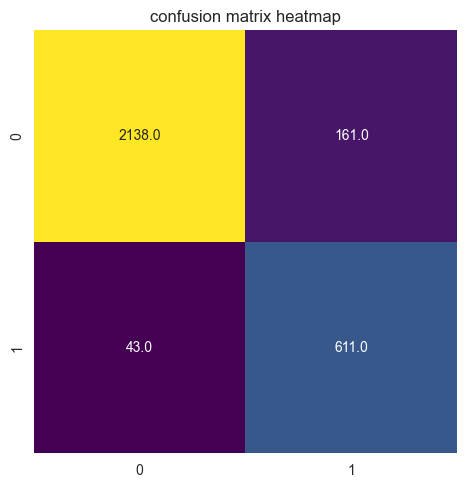

In [26]:
# confusion matrix
sns.heatmap(confusion_matrix(Y_test, Y_pred), square=True, fmt='.1f', annot=True, annot_kws={'size': 10}, cmap='viridis', cbar=False)
plt.title('confusion matrix heatmap')
plt.show()

# save model

In [27]:
# joblib.dump(xgbc, 'churn_xgbc.joblib')